<a href="https://colab.research.google.com/github/Pratch-yani/Face_Shape_Classification/blob/main/6_MODEL_EVALUATION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Face Shape Classification - Part 6

This notebook evaluates the 2 best CNN models (built from scratch vs. VGG-Face).  Analysis on confusion matrix, misclassification, and prediction probabilities.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Import Libraries

In [ ]:
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np 
import os 
import cv2
import pickle
import pandas as pd
import itertools
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix

%matplotlib inline


### Define Functions

In [ ]:
cm_plot_labels = ['Heart','Oblong','Oval','Round', 'Square']
fig_path = '/content/drive/My Drive/Colab Notebooks/Face_Shape_Classification/images/'

def create_confusion_matrix(y_test_labels, y_preds, classes, title='Confusion Matrix', 
                            normalize=False, cmap=plt.cm.Blues):

    cm = confusion_matrix(y_test_labels, y_preds)
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    # print(cm)

    plt.figure(figsize=(16,8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize = 15)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig(f"{fig_path+title}.png");    # for saving images to .png file
    plt.show()

In [ ]:
y_label_dict = {0: 'Heart', 1: 'Oblong', 2: 'Oval', 3: 'Round', 4: 'Square'}

def show_X_img(num, index_array, X_array, y_actual, fig_title, ncols=1):
    '''this function display images from an image array'''
    ncols= ncols
    nrows= int(num/ncols)
    fig, ax = plt.subplots(nrows, ncols, figsize =(ncols*4,nrows*4))
    fig.suptitle(fig_title, size = 20)
    ax = ax.ravel()
    for i, index in enumerate(index_array):
        img = X_array[index] * 255
        img = np.asarray(img, int)
        label = y_label_dict[y_actual[index]]
        ax[i].imshow(img, cmap='gray')
        ax[i].set_title(label, size=16)




In [ ]:
def compare_misclass(df, predict, fig_title='Comparing Misclassification', ax_title=''):
    fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(15,5))
    fig.suptitle(fig_title, fontsize=16)
    ax[0].hist(df.y_actual, bins=9, color='lightcoral')
    ax[0].set_xticks(range(0,5))
    ax[0].set_xticklabels(cm_plot_labels)
    ax[0].set_title(f'{ax_title}\n ACTUAL CLASS')
    ax[1].hist(df[predict], bins=9, color='mediumturquoise')
    ax[1].set_xticks(range(0,5))
    ax[1].set_xticklabels(cm_plot_labels)
    ax[1].set_title(f'{ax_title}\n PREDICTED CLASS');
    plt.savefig(f"{fig_path+fig_title}.png");

In [ ]:
def plot_misclass_img_proba(df, list_index):
  for i in list_index:
    img = X_test[i] * 255
    img = np.asarray(img, int)
    label = y_label_dict[y_actual[i]]

    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(img, cmap='gray')
    plt.title(label, size=16)
    plt.subplot(1,3,2)
    df.loc[i, ['heart_s', 'oblong_s', 'oval_s', 'round_s','square_s']].plot(kind='bar', color='pink')
    plt.title('Probabilities - CNN from scratch', fontsize=14, y=1.01)
    plt.subplot(1,3,3)
    df.loc[i, ['heart_t', 'oblong_t', 'oval_t', 'round_t','square_t']].plot(kind='bar', color='plum')
    plt.title('Probabilities - CNN transfer learning', fontsize=14, y=1.01);

### Import data files



In [ ]:
path = "/content/drive/My Drive/Colab Notebooks/Face_Shape_Classification/data/"

X_train = np.asarray(pickle.load(open(path + "X_train_rgb.pickle","rb")))
y_train = np.asarray(pickle.load(open(path + "y_train_rgb.pickle","rb")))
X_test = np.asarray(pickle.load(open(path + "X_test_rgb.pickle","rb")))
y_test = np.asarray(pickle.load(open(path + "y_test_rgb.pickle","rb")))

In [ ]:
print("Data Summary")
print("--------------------")
print(f"X_train shape {X_train.shape}")
print(f"y_train shape {y_train.shape}")
print("--------------------")
print(f"X_test shape {X_test.shape}")
print(f"y_test shape {y_test.shape}")

Data Summary
--------------------
X_train shape (4000, 224, 224, 3)
y_train shape (4000, 5)
--------------------
X_test shape (1000, 224, 224, 3)
y_test shape (1000, 5)


### Load saved models for evaluation

Both Convolutional Neural Network (CNN) models to be evaluated are generated from RGB color images with augmentation.  

- New model built from scratch `new`
- Transfer Learning from VGG Face `transfer`

In [ ]:
# New model from scratch

scratch_path = '/content/drive/My Drive/Colab Notebooks/Face_Shape_Classification/saved_models/extra/'
scratch_file = scratch_path + 'agmt_oct12_7'
mod_scratch = tf.keras.models.load_model(scratch_file)



In [ ]:
# Transfer Learning model from VGG-Face

transfer_path = '/content/drive/My Drive/Colab Notebooks/Face_Shape_Classification/saved_models/'
transfer_file = transfer_path + 'vgg16-face-2'
mod_transfer = tf.keras.models.load_model(transfer_file)

### Make predictions


First we generate predictions and prediction probabilities from the saved models.  This will be used in analysis and visualizations in next steps without having to load the model every time. 

In [ ]:
# Make predictions
y_actual = np.argmax(y_test, axis=-1)
y_predict_scratch = np.argmax(mod_scratch.predict(X_test), axis=1)
y_predict_transfer = np.argmax(mod_transfer.predict(X_test), axis=1)


In [ ]:
# Generate predict probabilities
predict_proba_scratch = mod_scratch.predict(X_test)
predict_proba_transfer = mod_transfer.predict(X_test)

In [ ]:
mod_scratch.evaluate(X_test, y_test)

32/32 [==============================] - 10s 321ms/step - loss: 0.8574 - accuracy: 0.7690


[0.8573569059371948, 0.7689999938011169]

In [ ]:
mod_transfer.evaluate(X_test, y_test)

32/32 [==============================] - 442s 14s/step - loss: 0.3922 - accuracy: 0.9270


[0.3922063708305359, 0.9269999861717224]

Normalized confusion matrix


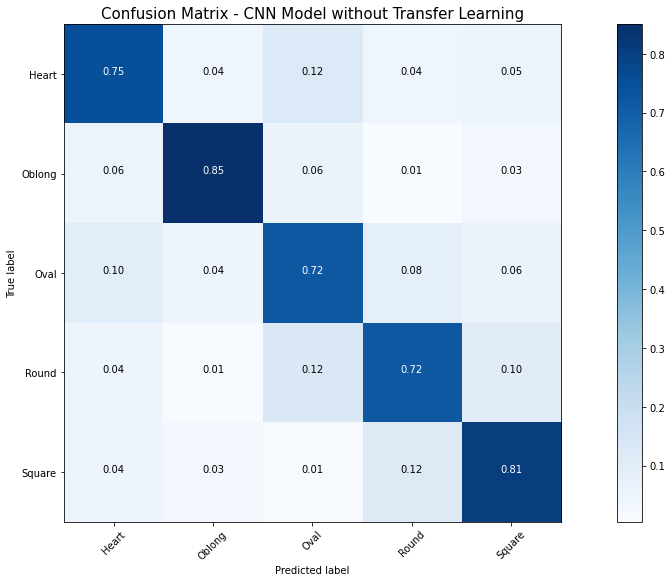

In [ ]:
create_confusion_matrix(y_actual, y_predict_scratch, cm_plot_labels, 
                        title='Confusion Matrix - CNN Model without Transfer Learning', 
                        normalize=True, cmap=plt.cm.Blues)

Normalized confusion matrix


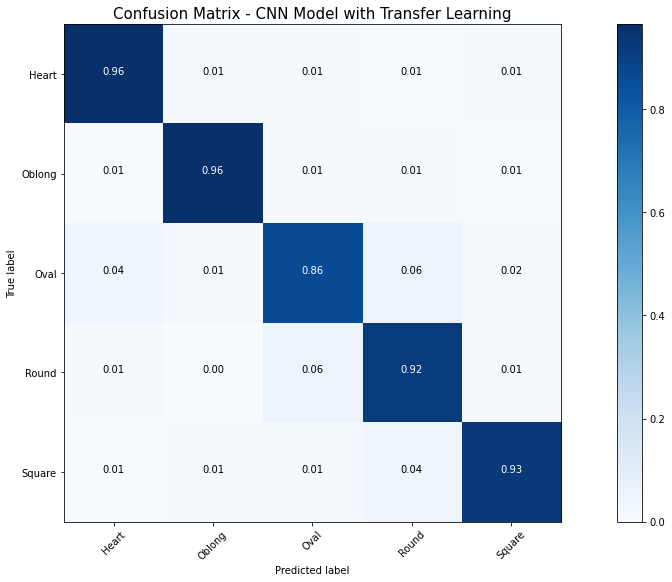

In [ ]:
create_confusion_matrix(y_actual, y_predict_transfer, cm_plot_labels, 
                        title='Confusion Matrix - CNN Model with Transfer Learning', 
                        normalize=True, cmap=plt.cm.Blues)

### Analysis of misclassification

In [ ]:
def create_df(y_actual, y_predict, predict_proba, X_test, y_test):
  '''this function creates a dataframe with predictions and probabilities of a model'''
  # generate predictions

  actual = pd.DataFrame(y_actual, columns=['y_actual'])
  predict = pd.DataFrame(y_predict, columns=['y_predict'])

  # generate prediction probabilities 

  probability_list = []
  for i, item in enumerate(predict_proba):
    probabilities = {}
    probabilities['heart'] = round(item[0] * 100,2)
    probabilities['oblong'] = round(item[1] * 100,2)
    probabilities['oval'] = round(item[2] *100,2)
    probabilities['round'] = round(item[3] *100,2)
    probabilities['square'] = round(item[4] *100,2)
    probability_list.append(probabilities)
  proba = pd.DataFrame(probability_list)

  # create dataframe
  df = pd.concat([actual, predict, proba],axis=1)
  
  return df


In [ ]:
scratch = create_df(y_actual, y_predict_scratch, predict_proba_scratch, X_test, y_test)

transfer = create_df(y_actual, y_predict_transfer, predict_proba_transfer, X_test, y_test)

In [ ]:
# dataframe for model built from scratch
scratch.columns = [x + '_s' for x in scratch.columns]
scratch.head()

,y_actual_s,y_predict_s,heart_s,oblong_s,oval_s,round_s,square_s
0,1,1,5.76,53.62,40.62,0.00,0.00
1,0,0,100.00,0.00,0.00,0.00,0.00
2,3,3,0.36,0.01,0.20,92.94,6.49
3,3,3,0.03,0.00,0.01,98.08,1.88
4,3,3,0.07,7.58,0.97,84.20,7.18


In [ ]:
# dataframe for model with transfer learning
transfer.columns = [x + '_t' for x in transfer.columns]
transfer.head()

,y_actual_t,y_predict_t,heart_t,oblong_t,oval_t,round_t,square_t
0,1,1,0.0,100.0,0.0,0.0,0.0
1,0,0,100.0,0.0,0.0,0.0,0.0
2,3,3,0.0,0.0,0.0,100.0,0.0
3,3,3,0.0,0.0,0.0,100.0,0.0
4,3,3,0.0,0.0,0.0,100.0,0.0


In [ ]:
# combine the data frame for evaluations
evaluations = pd.concat([scratch, transfer], axis=1)

# drop one of the y_actual as they are the same
evaluations = evaluations.drop(columns='y_actual_t')
evaluations = evaluations.rename(columns={'y_actual_s': 'y_actual'})

# create columns with actual labels
evaluations['actual'] = evaluations['y_actual'].map(y_label_dict)
evaluations['s_predict'] = evaluations['y_predict_s'].map(y_label_dict)
evaluations['t_predict'] = evaluations['y_predict_t'].map(y_label_dict)

# create new columns to detect where the 2 models misclassify, and the differences in predictions
evaluations['predict_diff'] = evaluations['y_predict_s'] - evaluations['y_predict_t']
evaluations['t_misclass'] = evaluations['y_actual'] - evaluations['y_predict_t']
evaluations['s_misclass'] = evaluations['y_actual'] - evaluations['y_predict_s']

evaluations

,y_actual,y_predict_s,heart_s,oblong_s,oval_s,round_s,square_s,y_predict_t,heart_t,oblong_t,oval_t,round_t,square_t,actual,s_predict,t_predict,predict_diff,t_misclass,s_misclass
0,1,1,5.76,53.62,40.62,0.00,0.00,1,0.0,100.0,0.00,0.00,0.0,Oblong,Oblong,Oblong,0,0,0
1,0,0,100.00,0.00,0.00,0.00,0.00,0,100.0,0.0,0.00,0.00,0.0,Heart,Heart,Heart,0,0,0
2,3,3,0.36,0.01,0.20,92.94,6.49,3,0.0,0.0,0.00,100.00,0.0,Round,Round,Round,0,0,0
3,3,3,0.03,0.00,0.01,98.08,1.88,3,0.0,0.0,0.00,100.00,0.0,Round,Round,Round,0,0,0
4,3,3,0.07,7.58,0.97,84.20,7.18,3,0.0,0.0,0.00,100.00,0.0,Round,Round,Round,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1,1,0.00,100.00,0.00,0.00,0.00,1,0.0,100.0,0.00,0.00,0.0,Oblong,Oblong,Oblong,0,0,0
996,4,4,0.03,0.00,0.00,0.73,99.23,4,0.0,0.0,0.00,0.00,100.0,Square,Square,Square,0,0,0
997,0,0,99.95,0.00,0.05,0.00,0.00,0,100.0,0.0,0.00,0.00,0.0,Heart,Heart,Heart,0,0,0
998,3,3,0.00,0.00,0.00,100.00,0.00,3,0.0,0.0,0.00,100.00,0.0,Round,Round,Round,0,0,0


In [ ]:
print('SUMMARY OF MISCLASSIFICATION')

correct = evaluations[(evaluations.y_predict_t == evaluations.y_actual) & (evaluations.y_predict_s == evaluations.y_actual)]
print(f'\nNumber of images that both models predicted correctly are {correct.shape[0]}')

misclass = evaluations[(evaluations.y_predict_t != evaluations.y_actual) | (evaluations.y_predict_s != evaluations.y_actual)]
print(f'Number of images that are misclassified by either of the models are {misclass.shape[0]}')
print(f'\n--------------------------------------------------------------------------------------\n')

# where both models predicted incorrectly
both_wrong = misclass[(misclass.s_misclass != 0) & (misclass.t_misclass != 0)]
both_wrong_same = misclass[((misclass.s_misclass != 0) & (misclass.t_misclass != 0)) & (misclass.t_misclass == misclass.s_misclass)]
both_wrong_different = misclass[((misclass.s_misclass != 0) & (misclass.t_misclass != 0)) & (misclass.t_misclass != misclass.s_misclass)]
print(f"Both models predicted incorrectly: {both_wrong.shape[0]}")
print(f"Same class: {both_wrong_same.shape[0]}")
print(f"Different class: {both_wrong_different.shape[0]}")
print(f'\n--------------------------------------------------------------------------------------\n')

# where transfer learning improved predictions vs. the model from scratch
t_misclass = misclass[(misclass.t_misclass != 0)]
print(f"Transfer learning predicted incorrectly: {misclass[(misclass.t_misclass != 0)].shape[0]}")
print(f"Model from scratch predicted correctly: {misclass[(misclass.t_misclass != 0) & (misclass.s_misclass == 0)].shape[0]}")
print(f'\n--------------------------------------------------------------------------------------\n')

# where model from scratch predicted correctly, but the transfer learning did not
s_misclass = misclass[(misclass.s_misclass != 0)]
print(f"Transfer learning predicted incorrectly: {misclass[(misclass.s_misclass != 0)].shape[0]}")
print(f"Model from scratch predicted correctly: {misclass[(misclass.s_misclass != 0) & (misclass.t_misclass == 0)].shape[0]}")
print(f'\n--------------------------------------------------------------------------------------\n')


SUMMARY OF MISCLASSIFICATION

Number of images that both models predicted correctly are 737
Number of images that are misclassified by either of the models are 263

--------------------------------------------------------------------------------------

Both models predicted incorrectly: 41
Same class: 25
Different class: 16

--------------------------------------------------------------------------------------

Transfer learning predicted incorrectly: 73
Model from scratch predicted correctly: 32

--------------------------------------------------------------------------------------

Transfer learning predicted incorrectly: 231
Model from scratch predicted correctly: 190

--------------------------------------------------------------------------------------



### Compare misclassification between 2 models
Transfer learning misclassification is mainly on OVAL shape, while the misclassification for the model from scratch is more spread across different classes.

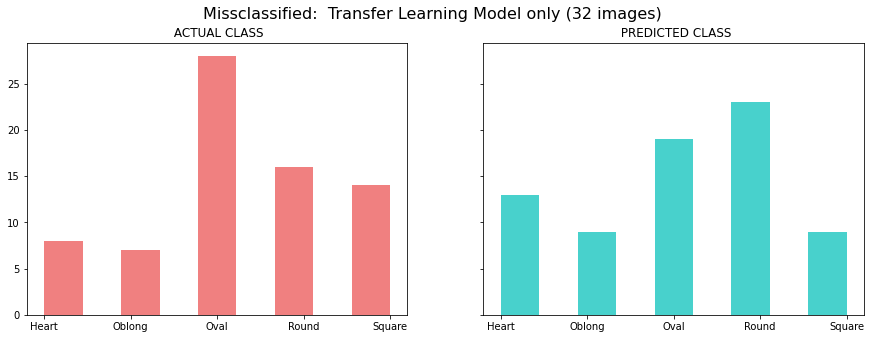

In [ ]:
compare_misclass(t_misclass, 'y_predict_t', fig_title='Missclassified:  Transfer Learning Model only (32 images)', ax_title='')

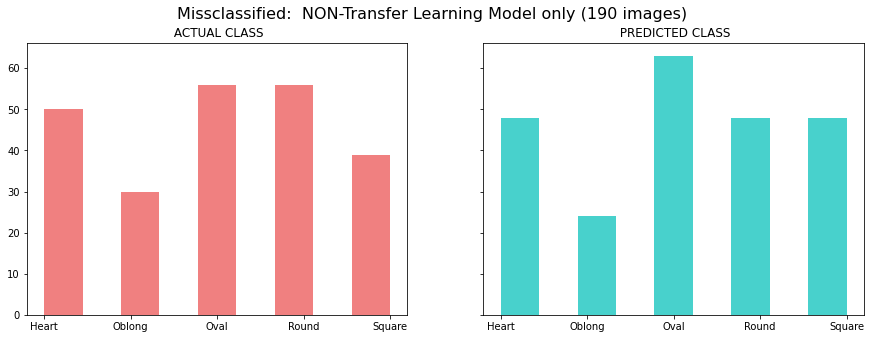

In [ ]:
compare_misclass(s_misclass, 'y_predict_s', fig_title='Missclassified:  NON-Transfer Learning Model only (190 images)', ax_title='')

### BOTH models misclassify the SAME CLASS:

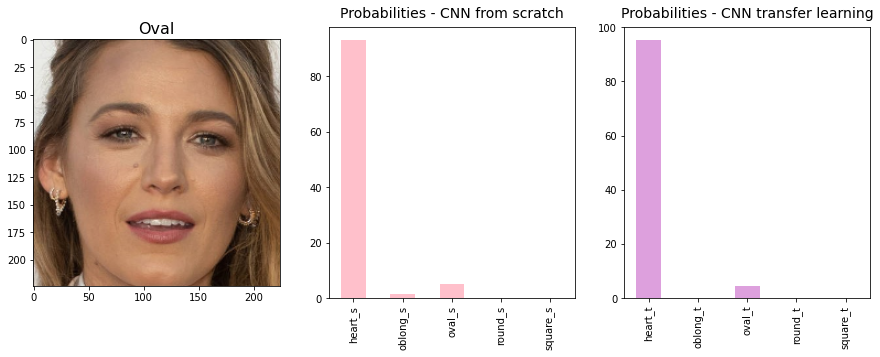

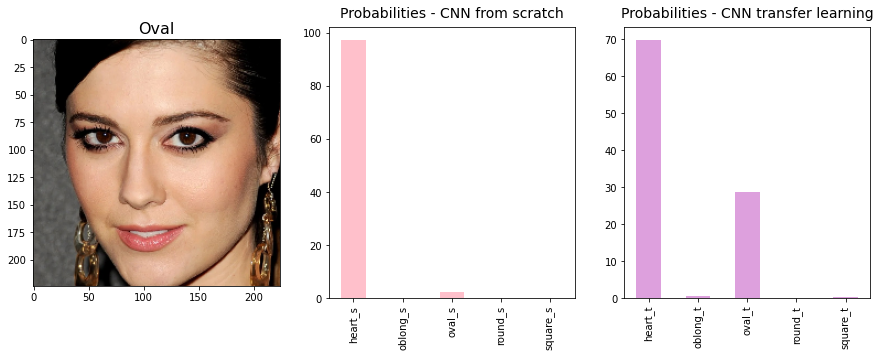

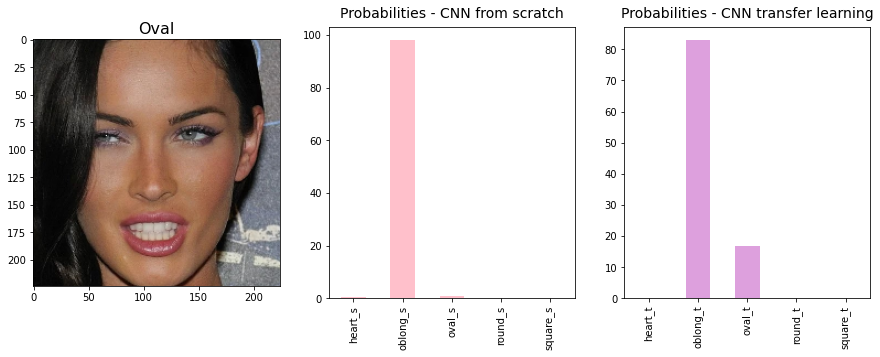

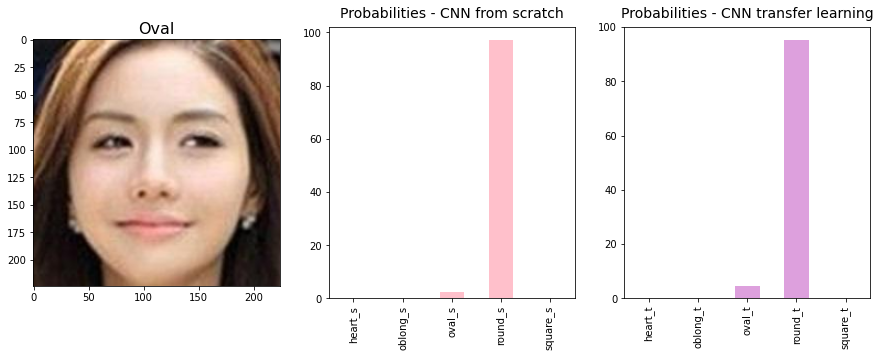

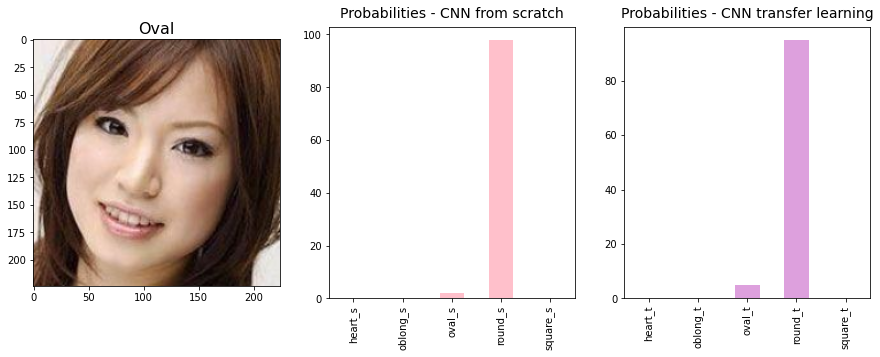

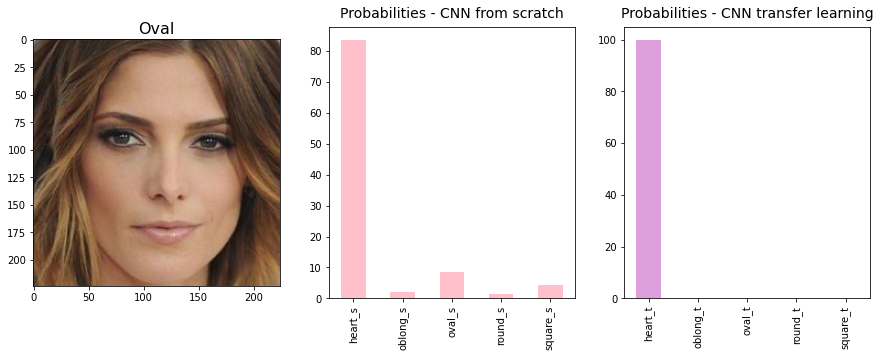

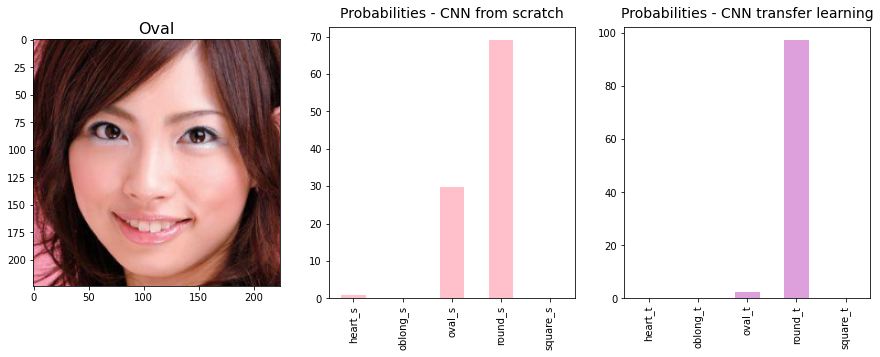

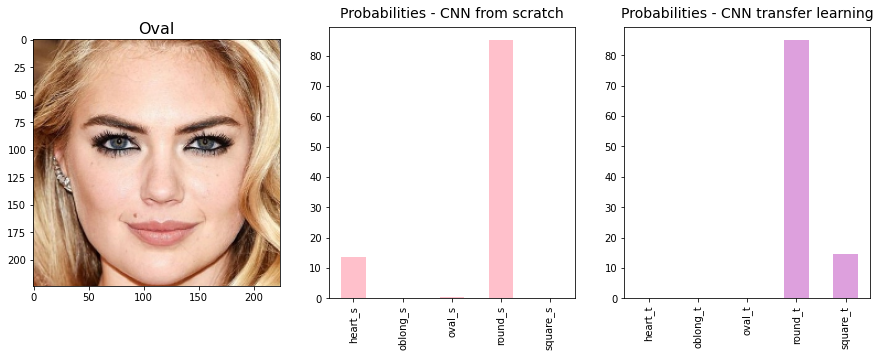

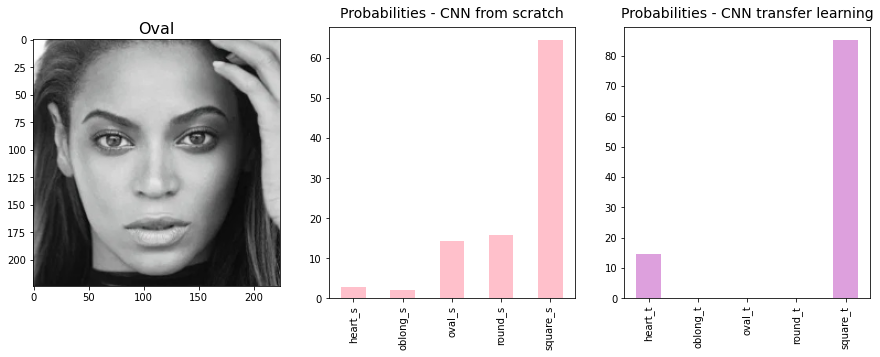

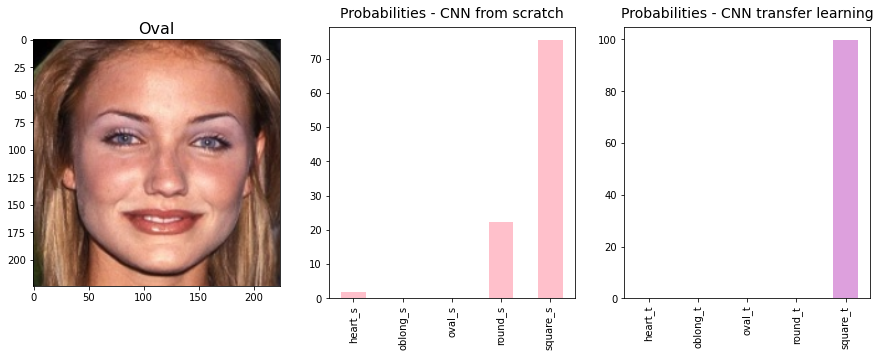

In [ ]:
# identify and plot 20 images where both models misclassify, but incorrectly predicted different classes.

both_wrong_same_index = both_wrong_same[(both_wrong_same.actual == 'Oval')].head(30).index
plot_misclass_img_proba(both_wrong_same[(both_wrong_same.actual == 'Oval')].head(30), both_wrong_same_index)

### BOTH models misclassify DIFFERENT CLASSES:

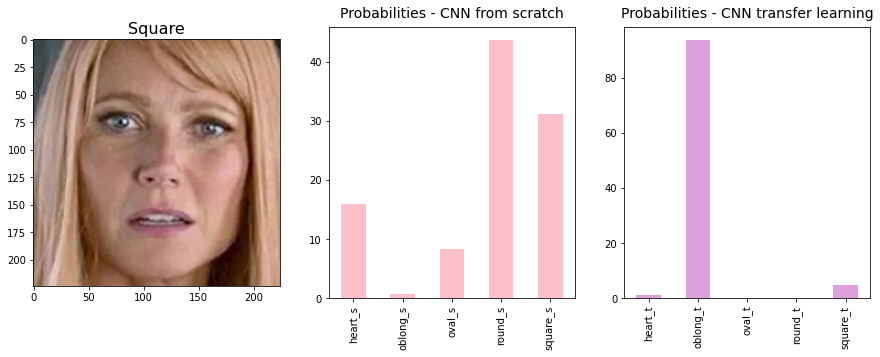

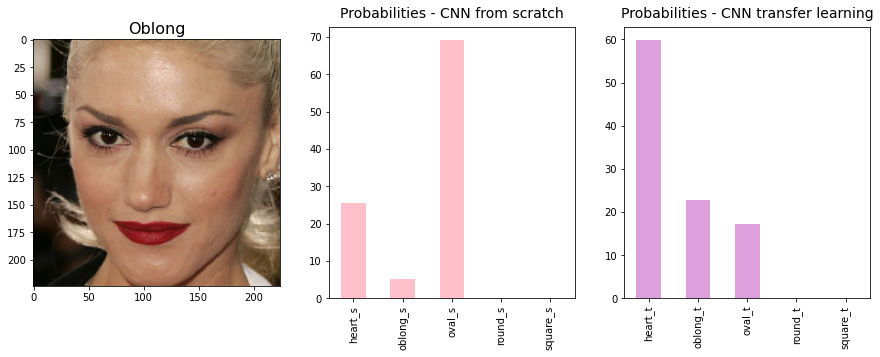

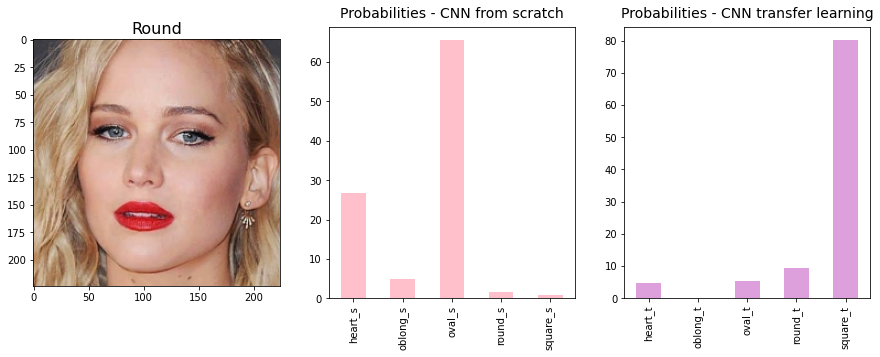

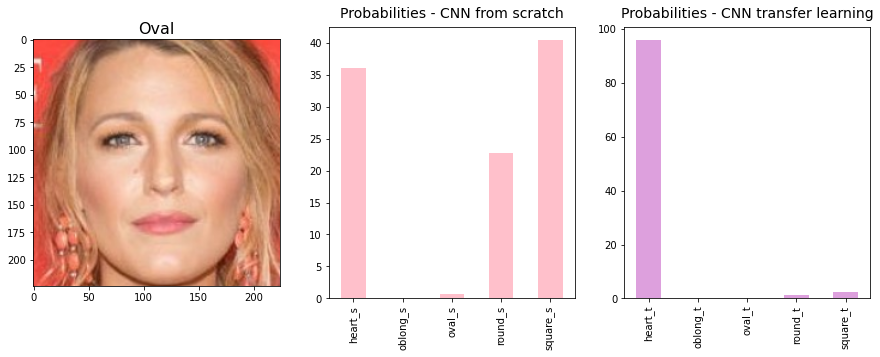

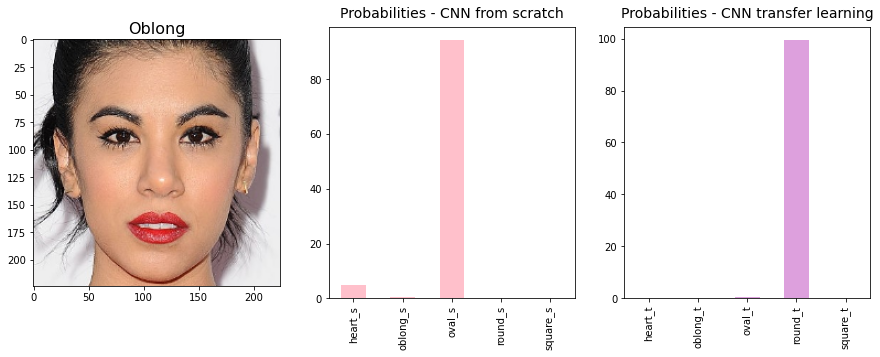

...

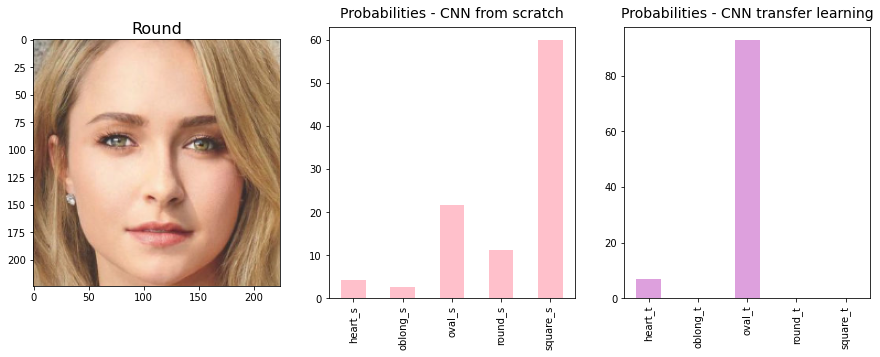

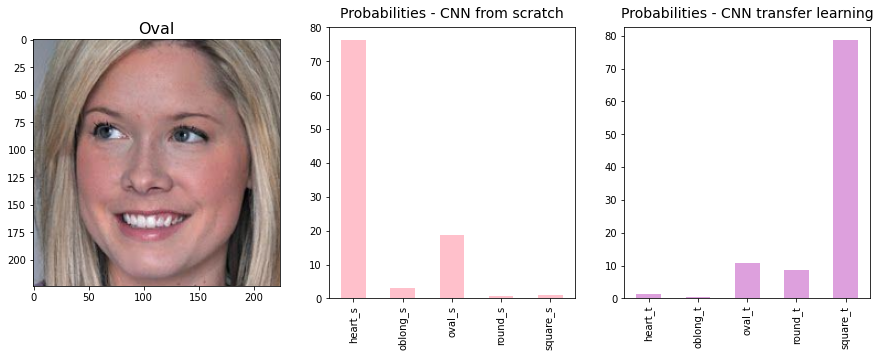

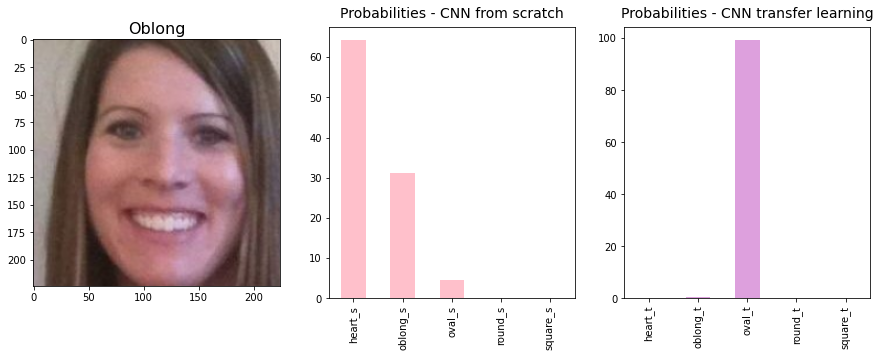

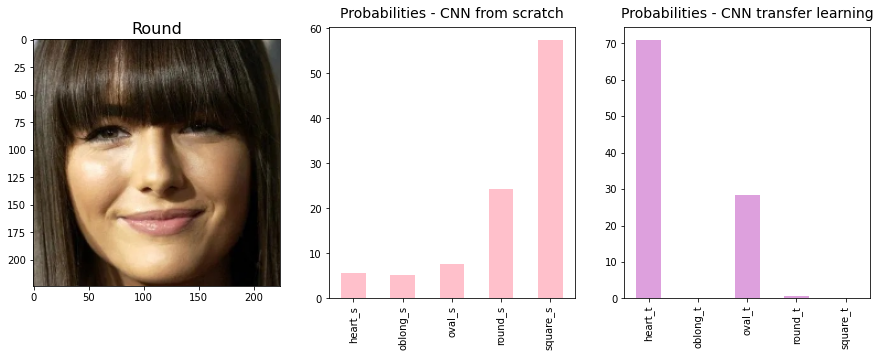

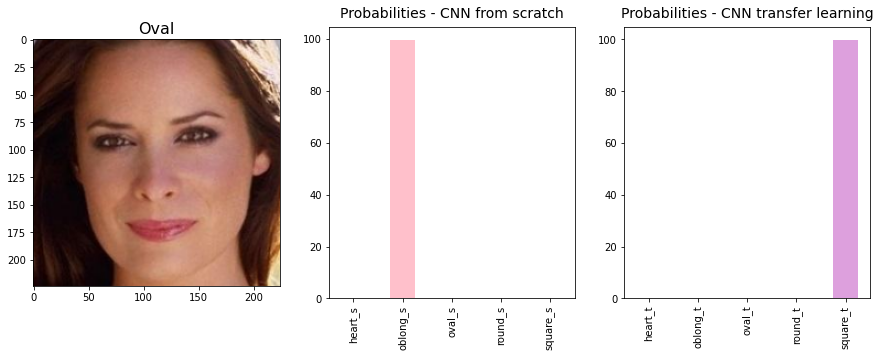

In [ ]:
# identify and plot 20 images where both models misclassify, but incorrectly predicted different classes.

both_wrong_different_index = both_wrong_different.head(20).index
plot_misclass_img_proba(both_wrong_different.head(20), both_wrong_different_index)

### Transfer Learning Misclassification

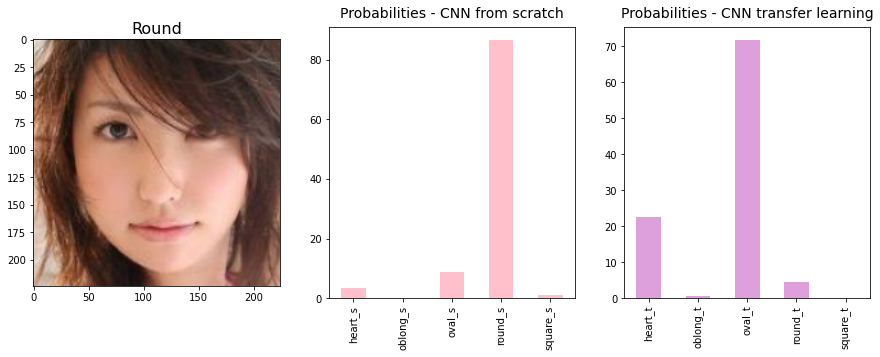

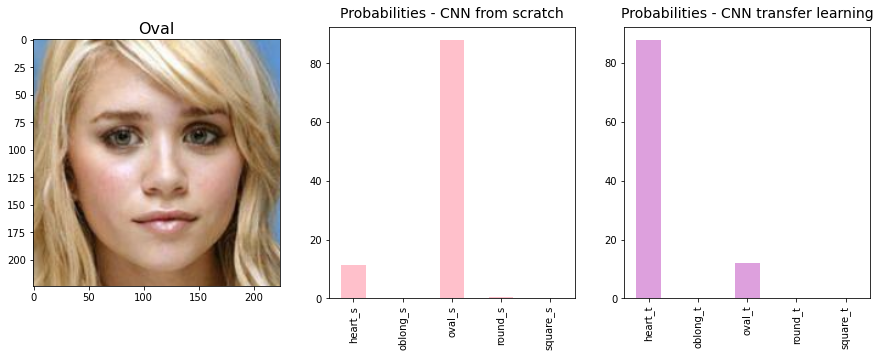

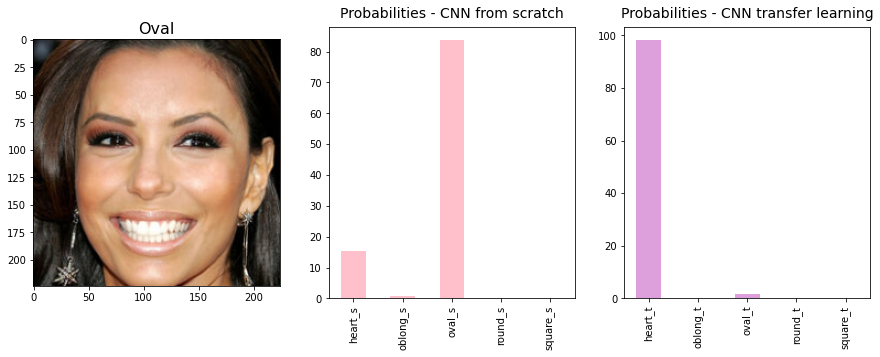

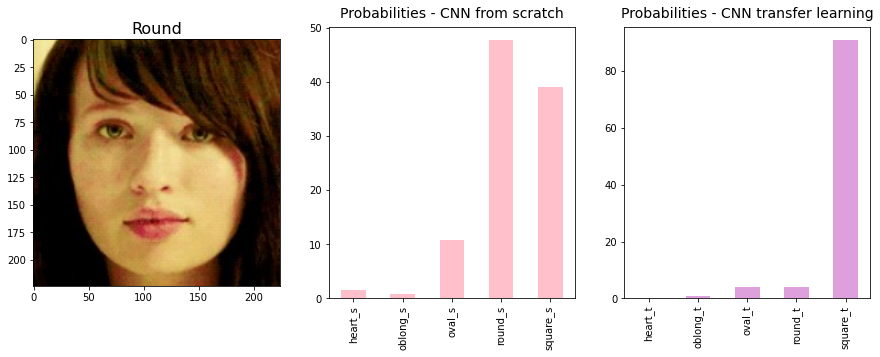

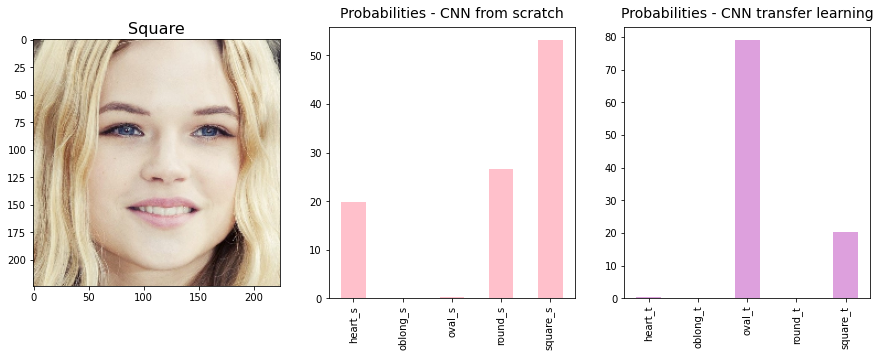

...

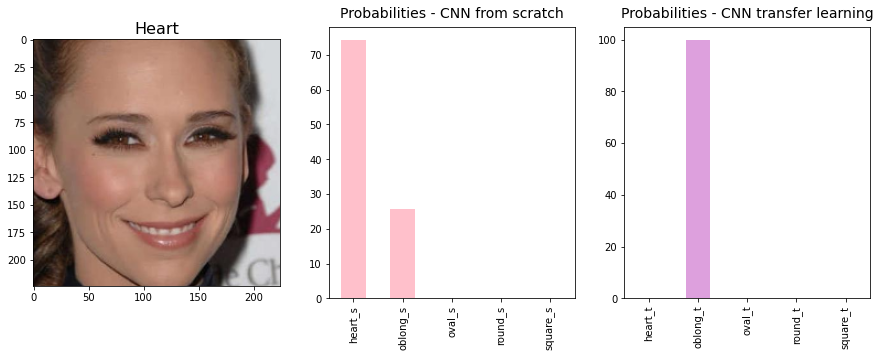

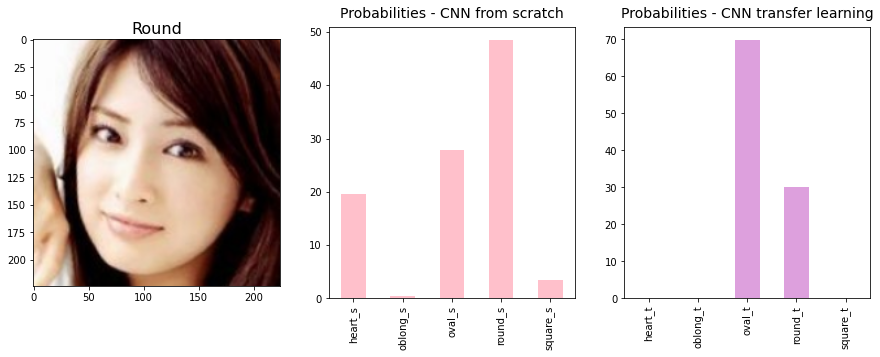

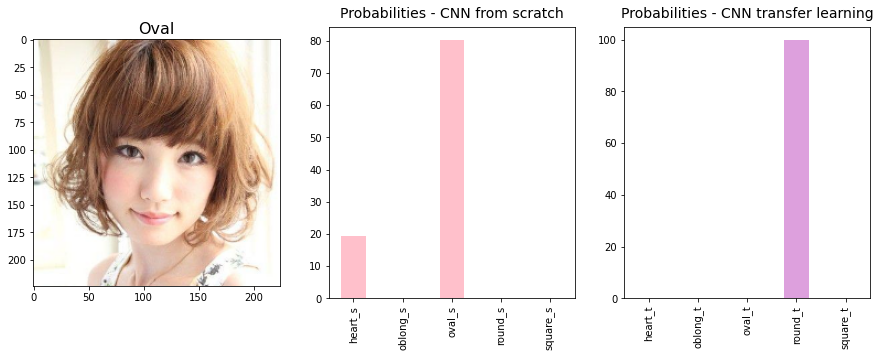

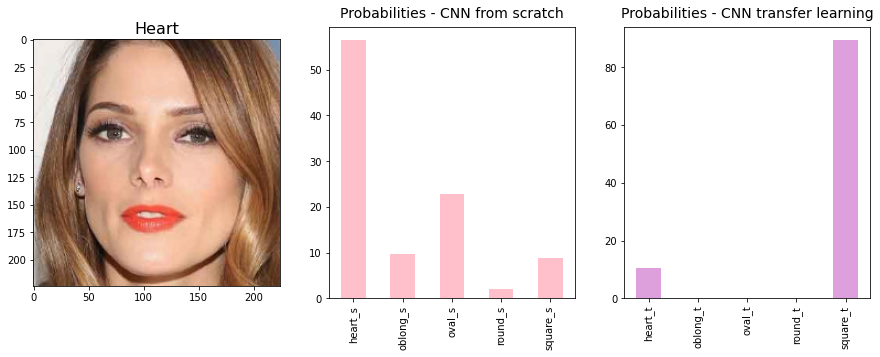

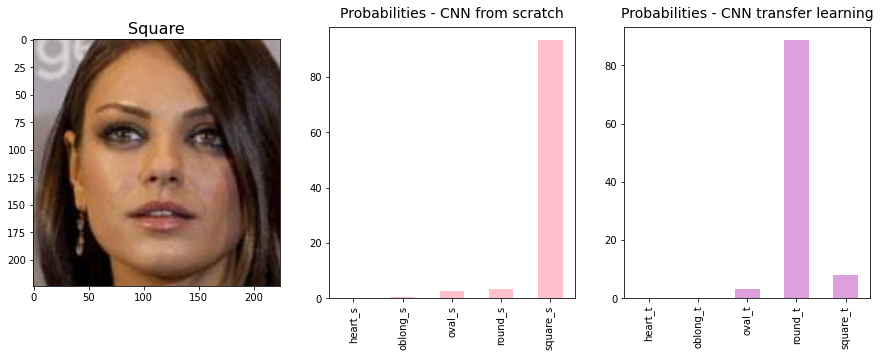

In [ ]:
# identify and plot 20 images where Transfer Learning misclassifies, but Model from scratch correctly predicted.

t_misclass_index = t_misclass[(t_misclass.s_misclass == 0)].head(20).index
plot_misclass_img_proba(t_misclass[(t_misclass.s_misclass == 0)].head(20), t_misclass_index)

### CNN from Scratch Misclassification -- How transfer learning improved probability of the predicted class to 100%

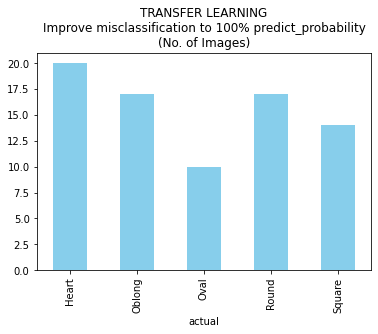

In [ ]:
# filter where CNN from scratch misclassification, while Transfer Learning has 100% probability on the predicted class
mask_100 = ((s_misclass.heart_t == 100) | (s_misclass.oblong_t == 100) | (s_misclass.oval_t == 100) |
            (s_misclass.round_t == 100) | (s_misclass.square_t == 100))
s_misclass_t100 = s_misclass[(mask_100)]
s_misclass_t100.groupby('actual')['y_actual'].count().plot(kind='bar', color='skyblue')
plt.title('TRANSFER LEARNING\nImprove misclassification to 100% predict_probability\n(No. of Images)');
plt.savefig(f"transfer_100.png");

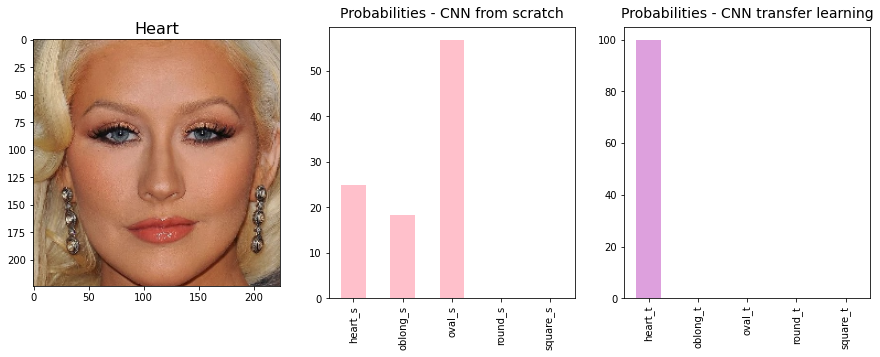

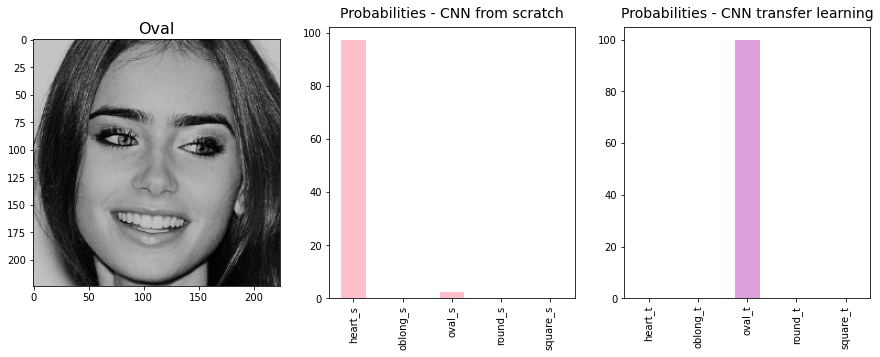

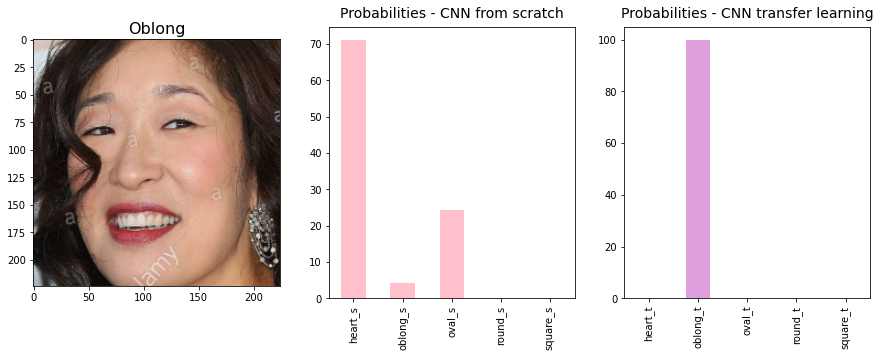

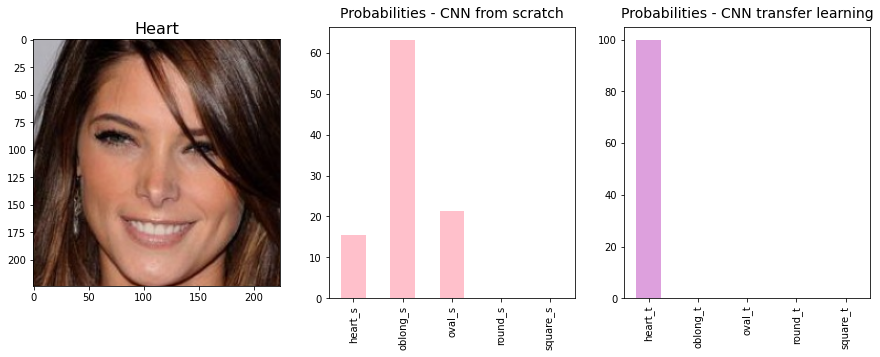

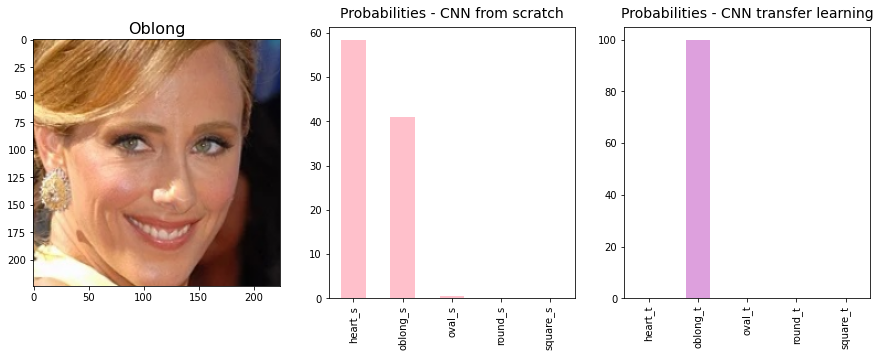

...

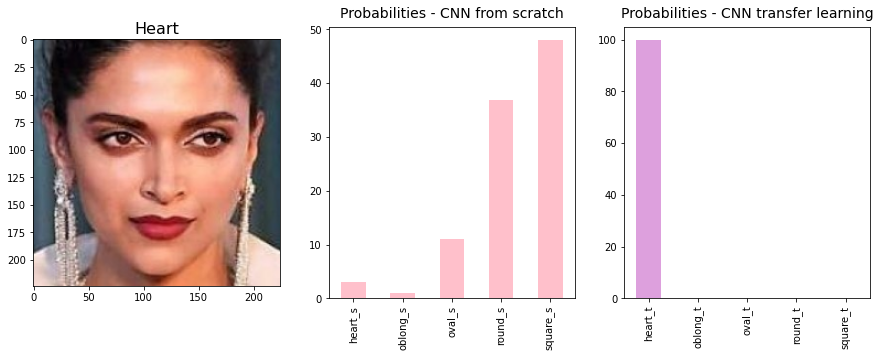

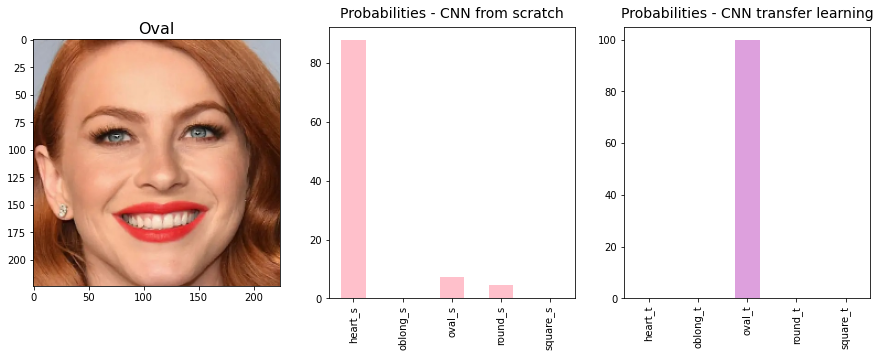

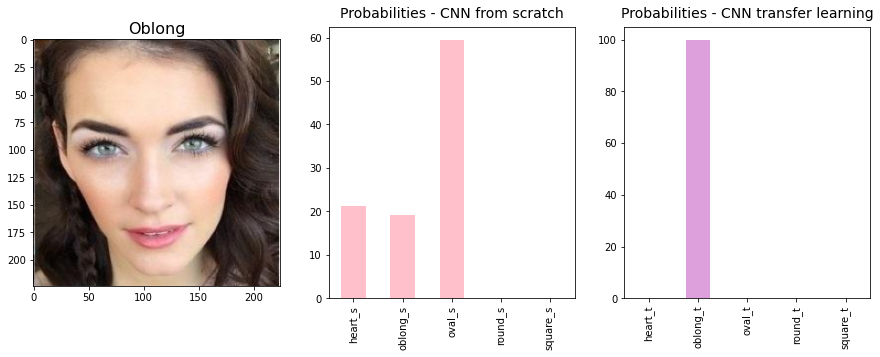

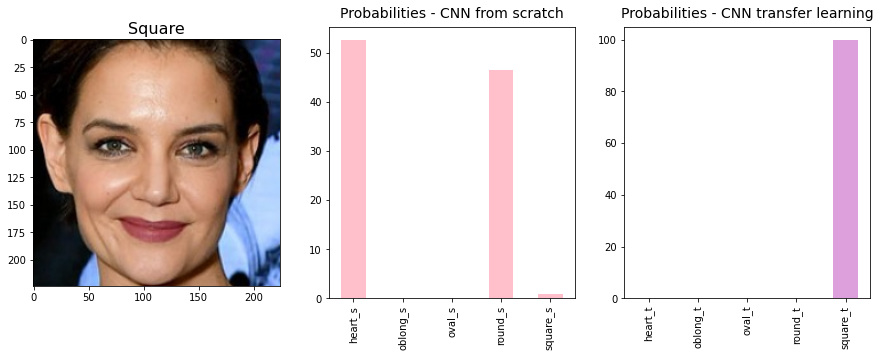

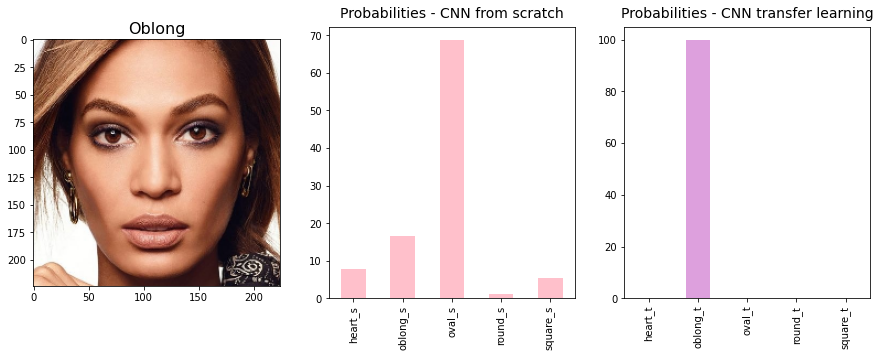

In [ ]:
s_misclass_t100_index = s_misclass_t100.head(20).index
plot_misclass_img_proba(s_misclass_t100.head(20), s_misclass_t100_index)